# Part 3: Writing your own news article

In [ ]:
#Import Packages
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Embedding, Conv1D, GlobalMaxPooling1D, GlobalAveragePooling1D, LSTM, SimpleRNN,TextVectorization
import tensorflow as tf
from keras.regularizers import l2
from keras import utils as np_utils
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import layers
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense, Embedding
from keras.preprocessing.text import Tokenizer
from keras.utils import pad_sequences
from keras.utils import to_categorical

import random
import os
import shutil
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

#Reading in and printing details of dataset
articles=pd.read_csv('drive/MyDrive/guardian_articles.csv')
print(articles.shape)
articles.head()

#Getting percentage of missing data
print((articles.isnull().sum()/len(articles))*100)

#Function to check for unique values
def unique_values(data):
    total = data.count()
    tt = pd.DataFrame(total)
    tt.columns = ['Total']
    uniques = []
    for col in data.columns:
        unique = data[col].nunique()
        uniques.append(unique)
    tt['Uniques'] = uniques
    return tt

unique_values(articles)
##Small few duplicates 

#Removing articles without content
articles_clean = pd.DataFrame(articles[~articles.bodyContent.isnull()])

#Sampling 10% of articles for testing
articles_sample = articles_clean.sample(frac = 0.3, random_state = 42)
print(articles_sample.shape)

Mounted at /content/drive
(149839, 7)
article_id            0.00000
sectionName           0.00000
webTitle              0.00000
webUrl                0.00000
bodyContent           0.73946
webPublicationDate    0.00000
id                    0.00000
dtype: float64
(44619, 7)


In [ ]:
count_section_name = articles_sample.groupby("sectionName").count()['article_id'].reset_index()

In [ ]:
top_two_sections  = count_section_name.sort_values("article_id", ascending=False)[:2]
top_two_sections


,sectionName,article_id
102,World news,4689
67,Opinion,3562


In [ ]:
#Mapping Section Names to Integers as Category ID
model_data_predict = articles_sample[["bodyContent","sectionName"]]
model_data_predict = model_data_predict[model_data_predict.sectionName.isin(top_two_sections.sectionName)]
model_data_predict = model_data_predict.bodyContent.sample(frac=.25, random_state=42)
model_data_predict.shape


(2063,)

In [ ]:
text=model_data_predict.values
textString = ''.join(text).replace("\n"," ")
textString = textString.encode("ascii", "ignore")
textString = textString.decode()
textString=textString.replace("\x1d"," ")

textString

"Established 125 years before Shakespeare penned Romeo and Juliet, the Banca Monte dei Paschi di Siena was founded in 1472 to help finance the city state of Siena, as well as its artistic renaissance. For more than 500 years the worlds oldest bank has operated successfully, through wars, revolutions and other political upheavals. In the 1990s it was Europes most profitable bank. How things change. This week the European Central Bank agreed the financial details of (another) bailout package for the banca, which was previously rescued in 2013. Its financial prospects, along with those of the Italian banking system, appear to be deteriorating. One of the main credit rating agencies just put the country on negative outlook  a warning of worsening economic prospects. Italian banks have amassed 290bn in bad loans  around 18% of all loans in the country and one third of bad loans in the euro area. More than 75% of these are loans to companies. Banks cannot write these off, as it would render 

In [ ]:
# The maximum length sentence we want for a single input in characters
seq_length = 100
examples_per_epoch = len(textString)//(seq_length+1)

# extract an ordered vocabulary - this will be lower case letters only (and spaces). 
vocab = sorted(set(textString))

# Create mappings between vocab and numeric indices
char2idx = {u:i for i, u in enumerate(vocab)}
idx2char = np.array(vocab)

# Map all the training text over to a numeric representation
text_as_int = np.array([char2idx[c] for c in textString])

# Create training examples / targets
char_dataset = tf.data.Dataset.from_tensor_slices(text_as_int)
sequences = char_dataset.batch(seq_length+1, drop_remainder=True)

def split_input_target(chunk):
    input_text = chunk[:-1]
    target_text = chunk[1:]
    return input_text, target_text

dataset = sequences.map(split_input_target)



In [ ]:
np.save('/content/drive/MyDrive/Deep_Learning_Models/char2idx.dict', char2idx)
np.save('/content/drive/MyDrive/Deep_Learning_Models/idx2char.dict', idx2char)


In [ ]:
type(char2idx)

dict

In [ ]:
print(examples_per_epoch)
print(len(sequences))
print(len(textString))

99197
99197
10018923


In [ ]:
# Building Model

batch_size = 64
buffer_size = 10000
rnn_units = 2048
embedding_dim = 256

dataset = dataset.shuffle(buffer_size).batch(batch_size, drop_remainder=True)

model = tf.keras.Sequential()
model.add(tf.keras.layers.Embedding(len(vocab), embedding_dim,
                          batch_input_shape=[batch_size, None]))

model.add(layers.LSTM(rnn_units,return_sequences=True))

model.add(tf.keras.layers.Dense(len(vocab)))

model.summary()

def loss(labels, logits):
    return tf.keras.losses.sparse_categorical_crossentropy(labels, logits, from_logits=True)

model.compile(optimizer='adam', loss=loss)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (64, None, 256)           22272     
                                                                 
 lstm (LSTM)                 (64, None, 2048)          18882560  
                                                                 
 dense (Dense)               (64, None, 87)            178263    
                                                                 
Total params: 19,083,095
Trainable params: 19,083,095
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# Running Model


# Directory where the checkpoints will be saved
my_temp_folder = "./"
checkpoint_dir = my_temp_folder+'training_checkpoints'
try:
    shutil.rmtree(checkpoint_dir)
except:
    print("directory not used yet.")

# Name of the checkpoint files
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt_")

# Creating callbacks for early stopping and creating model checkpoints
callbacks = [
    EarlyStopping(monitor='loss', patience=3),
    ModelCheckpoint(filepath=checkpoint_prefix, monitor='loss', save_weights_only=True, save_best_only=True)
]

epochs = 40
history = model.fit(dataset, epochs=epochs, callbacks=callbacks, verbose=1)
print("Training Complete.")


directory not used yet.
Epoch 1/40
   9/1549 [..............................] - ETA: 6:51 - loss: 4.5054

In [ ]:
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
    model = tf.keras.models.Sequential()

    model.add(tf.keras.layers.Embedding(
      input_dim=vocab_size,
      output_dim=embedding_dim,
      batch_input_shape=[batch_size, None]
    ))

    model.add(tf.keras.layers.LSTM(
      units=rnn_units,
      return_sequences=True,
      stateful=True,
      recurrent_initializer=tf.keras.initializers.GlorotNormal()
    ))

    model.add(tf.keras.layers.Dense(vocab_size))
  
    return model

simplified_batch_size = 1

model_predict = build_model(len(vocab), embedding_dim, rnn_units, batch_size=1)

model_predict.load_weights(tf.train.latest_checkpoint(checkpoint_dir))

model_predict.build(tf.TensorShape([simplified_batch_size, None]))

model_predict.summary()

In [ ]:
model_predict.save('generative_model_b1.h5')
shutil.copy("generative_model_b1.h5", "/content/drive/MyDrive/Deep_Learning_Models/generative_model_b1.h5")

In [ ]:
def generate_text(model, temp, start_string):
  
    # Number of characters to generate
    num_generate = 500

    # Converting our start string to numbers (vectorizing)
    input_eval = [char2idx[s] for s in start_string]
    input_eval = tf.expand_dims(input_eval, 0)

    # Empty string to store our results
    text_generated = []

    # Low temperatures results in more predictable text.
    # Higher temperatures results in more surprising text.
    # Experiment to find the best setting.
    temperature = temp

    # Here batch size == 1
    model.reset_states()
    text_ids_gen = []
    for i in range(num_generate):
        predictions = model(input_eval)
        # remove the batch dimension
        predictions = tf.squeeze(predictions, 0)

        # using a categorical distribution to predict the character returned by the model
        predictions = predictions / temperature
        predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()

        # We pass the predicted character as the next input to the model
        # along with the previous hidden state
        input_eval = tf.expand_dims([predicted_id], 0)

        text_ids_gen.append(predicted_id)
        text_generated.append(idx2char[predicted_id])

    return (start_string + ''.join(text_generated))

In [ ]:
# Temperature controlling the randomness
for temp in [0.2, 0.5, 0.8, 1.0]:
    print("...Temperature:", temp)

    print(generate_text(model_predict,temp, start_string=u"Female doctors are"))
    print()

...Temperature: 0.2
Female doctors are being treated as a common sense of democracy and the consequences of the presence of the context of the pandemic, when the country is now pressing its first case of coronavirus. The company has been assessed by the UK and the US, the US and EU countries are also carried out by the US and the US president of the United Nations Child Health and Social Care said: The UK has sometimes been accepted as a particularly high profile that the president was seeking to recognise the political revolution o

...Temperature: 0.5
Female doctors are being charged with a great recession. The consequences of the EU will be a recent report, which states: Christians moved at a price on behalf of the pandemic, the court has said what the government is coming to our homes and listen to reassurances from the government of the United States to respond to the far right, it is a substantial bill that will be clear: When I think the plane had been proved a leading figure in

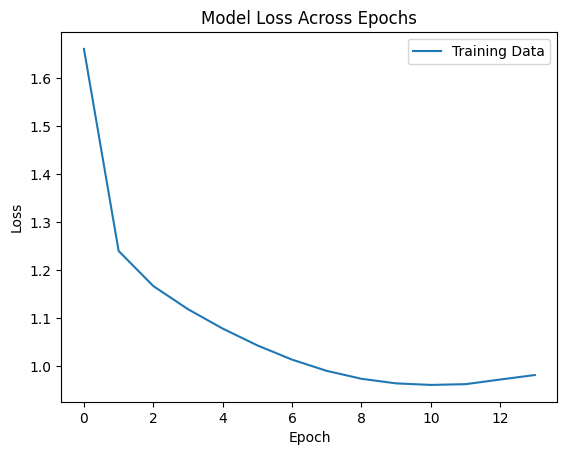

In [ ]:
def display_training_history(training_history):
    loss = training_history.history['loss']
    plt.title('Model Loss Across Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.plot(loss, label='Training Data')
    plt.legend()
    plt.show()

display_training_history(history)



In [ ]:
loss = min(history.history['loss'])
import math
perplexity = math.exp(loss)
print(f"The perplexity of the model is " + str(perplexity))


The perplexity of the model is 2.6125286020096192
